In [46]:
import sys
sys.path.append("..")

import pandas as pd

from torch.utils.data import DataLoader
from model_zoo import get_model
from dataset_zoo import VG_Relation, VG_Attribution

In [41]:
# Please put your data root directory below. We'll download VG-Relation and VG-Attribution images here. 
# Will be a 1GB zip file (a subset of GQA).
root_dir="unity/" 


In [30]:
!pwd

/home/zahid/work/mvlan/vision-language-models-are-bows/unity


In [44]:
import open_clip
from model_zoo.clip_models import CLIPWrapper

# model, preprocess = get_model(model_name="epoch_15", device="cuda", root_dir=root_dir)

model, _, image_preprocess = open_clip.create_model_and_transforms('ViT-B-32', pretrained='epoch_15.pt', device="cuda")
model = model.eval()
clip_model = CLIPWrapper(model, device="cuda") 


In [45]:
print(image_preprocess)

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    <function _convert_to_rgb at 0x7f163f624790>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)


In [ ]:
# Get the VG-R dataset
vgr_dataset = VG_Relation(image_preprocess=image_preprocess, download=False, root_dir='.')
vgr_loader = DataLoader(vgr_dataset, batch_size=16, shuffle=False)

# Compute the scores for each test case
vgr_scores = clip_model.get_retrieval_scores_batched(vgr_loader)
print(len(vgr_loader), len(vgr_dataset))

: 

torch.Size([3, 224, 224])


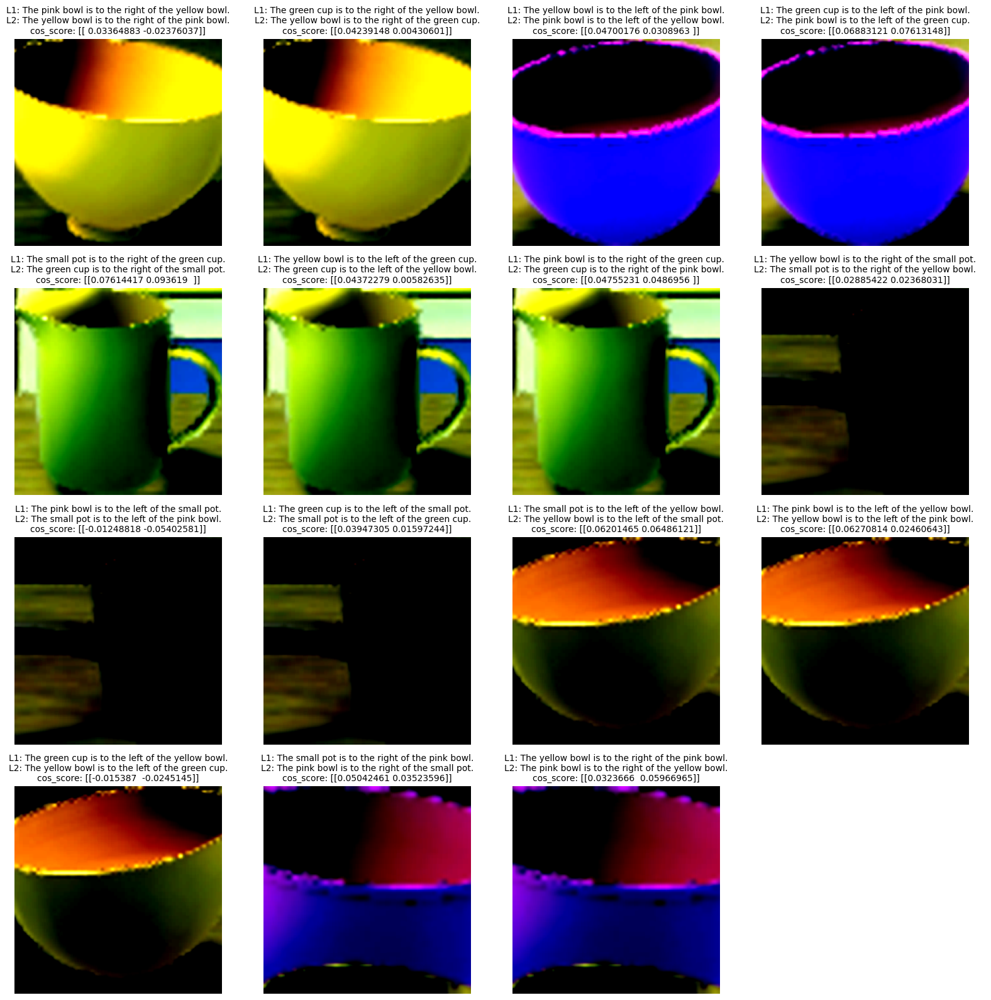

In [38]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# Extract the fourth batch from the DataLoader
data_iter = iter(vgr_loader)
for _ in range(1):
    _ = next(data_iter)

first_batch = next(data_iter)
image_tensors = first_batch['image_options'] # 1batch=16 image tensors
labels = first_batch['caption_options'] #len=2, true/false labels
first_batch_scores = vgr_scores[:16]
print(image_tensors[0][0].shape) # one image shape
# Collect indices where labels contain "left" or "right"
relevant_indices = [i for i, (l1, l2) in enumerate(zip(labels[0], labels[1])) if "left" in l1 or "right" in l1 or "left" in l2 or "right" in l2]

num_relevant = len(relevant_indices)
# Decide on a grid layout for the subplots
cols = int(np.ceil(np.sqrt(num_relevant)))
rows = int(np.ceil(num_relevant / cols))

# set the plot axes
fig, axs = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
if num_relevant == 1:
    axs = [axs]
axs = axs.ravel()

for ax_idx, img_idx in enumerate(relevant_indices):
    # Convert tensor to numpy array and transpose
    image_np = image_tensors[0][img_idx].numpy().transpose(1, 2, 0)
    image_np = np.clip(image_np, 0, 1)
    axs[ax_idx].imshow(image_np)
    axs[ax_idx].axis('off')
    title_text = f"L1: {labels[0][img_idx]}\nL2: {labels[1][img_idx]}\ncos_score: {first_batch_scores[img_idx]}"
    axs[ax_idx].set_title(title_text, fontsize=10)

# Hide any extra subplot axes
for ax_idx in range(num_relevant, rows*cols):
    axs[ax_idx].axis('off')

plt.tight_layout()
plt.show()


In [39]:
# Evaluate the macro accuracy
vgr_records = vgr_dataset.evaluate_scores(vgr_scores)
print(vgr_records)
df = pd.DataFrame(vgr_records)
df = df.rename(columns={'Count': 'no_sample', 'Relation': 'sp_relation'})
df['Dataset'] = 'unity'

print(f"VG-Relation Macro Accuracy: {df.Accuracy.mean()}")
df

[{'Relation': 'behind', 'Accuracy': 0.24005134788189988, 'Count': 779, 'Dataset': 'Visual Genome Relation'}, {'Relation': 'in front', 'Accuracy': 0.5134443021766966, 'Count': 781, 'Dataset': 'Visual Genome Relation'}, {'Relation': 'to the left', 'Accuracy': 0.2776957163958641, 'Count': 4062, 'Dataset': 'Visual Genome Relation'}, {'Relation': 'to the right', 'Accuracy': 0.22328902018709995, 'Count': 4062, 'Dataset': 'Visual Genome Relation'}]
VG-Relation Macro Accuracy: 0.31362009666039015


,sp_relation,Accuracy,no_sample,Dataset
0,behind,0.240051,779,unity
1,in front,0.513444,781,unity
2,to the left,0.277696,4062,unity
3,to the right,0.223289,4062,unity


In [ ]:
# Evaluate the macro accuracy
vgr_records = vgr_dataset.evaluate_scores(vgr_scores)
print(vgr_records)
df = pd.DataFrame(vgr_records)
df = df.rename(columns={'Count': 'no_sample', 'Relation': 'sp_relation'})
df['B'] = df['A']

print(f"VG-Relation Macro Accuracy: {df.Accuracy.mean()}")
df

[{'Relation': 'behind', 'Accuracy': 0.1810012836970475, 'Count': 779, 'Dataset': 'Visual Genome Relation'}, {'Relation': 'in front', 'Accuracy': 0.5364916773367477, 'Count': 781, 'Dataset': 'Visual Genome Relation'}, {'Relation': 'to the left', 'Accuracy': 0.4160512063023141, 'Count': 4062, 'Dataset': 'Visual Genome Relation'}, {'Relation': 'to the right', 'Accuracy': 0.48375184638109303, 'Count': 4062, 'Dataset': 'Visual Genome Relation'}]
VG-Relation Macro Accuracy: 0.4043240034293006


,sp_relation,Accuracy,no_sample,Dataset
0,behind,0.181001,779,Visual Genome Relation
1,in front,0.536492,781,Visual Genome Relation
2,to the left,0.416051,4062,Visual Genome Relation
3,to the right,0.483752,4062,Visual Genome Relation


In [96]:
import json
import os
import random


# Function to determine relative position
def determine_relative_position(obj1, obj2):
    # center of each object
    obj1_center_x = obj1["origin"][0] + obj1["dimension"][0] / 2
    obj1_center_y = obj1["origin"][1] + obj1["dimension"][1] / 2
    obj2_center_x = obj2["origin"][0] + obj2["dimension"][0] / 2
    obj2_center_y = obj2["origin"][1] + obj2["dimension"][1] / 2

    # horizontal and vertical distances between centers
    dx = abs(obj1_center_x - obj2_center_x)
    dy = abs(obj1_center_y - obj2_center_y)

    # sum of half-widths of the objects
    half_width1 = obj1["dimension"][0] / 2
    half_width2 = obj2["dimension"][0] / 2

    # Check if obj1 is in front of or behind obj2 based on horizontal distance
    if dx < half_width1 + half_width2:
        if obj1_center_y < obj2_center_y:
            return "behind"
        else:
            return "in front"

    # Check left or right based on horizontal position
    if obj1_center_x < obj2_center_x:
        return "to the left"
    elif obj1_center_x > obj2_center_x:
        return "to the right"
    else:
        return "on the same vertical line"

# generate target data from a single JSON file
def generate_target_data_from_json(json_file_path, swap_objects=False):
    # Load the source json
    with open(json_file_path, 'r') as f:
        data = json.load(f)
    captures = data["captures"][0]
    annotations = captures["annotations"][0]["values"]
    target_data = []

    for i in range(len(annotations)):
        for j in range(len(annotations)):
            if i != j:
                obj1 = annotations[i]
                obj2 = annotations[j]
                relative_position = determine_relative_position(obj1, obj2)
                #True_caption
                if relative_position =="behind":
                    true_caption = f"The {(' ').join(obj1['labelName'].split('_')).lower()} is {relative_position} the {(' ').join(obj2['labelName'].split('_')).lower()}."
                else:
                    true_caption = f"The {(' ').join(obj1['labelName'].split('_')).lower()} is {relative_position} of the {(' ').join(obj2['labelName'].split('_')).lower()}."
                
                #False_caption: swap_objects= True or swap_sp_words= left -> right
                if swap_objects: 
                    if relative_position =="behind":
                        false_caption = f"The {(' ').join(obj2['labelName'].split('_')).lower()} is {relative_position} the {(' ').join(obj1['labelName'].split('_')).lower()}."
                    else:
                        false_caption = f"The {(' ').join(obj2['labelName'].split('_')).lower()} is {relative_position} of the {(' ').join(obj1['labelName'].split('_')).lower()}."
                else: 
                    if relative_position =="behind":
                        false_caption = f"The {(' ').join(obj1['labelName'].split('_')).lower()} is in front of the {(' ').join(obj2['labelName'].split('_')).lower()}."
                    else:
                        if relative_position== "to the right":
                            false_caption = f"The {(' ').join(obj1['labelName'].split('_')).lower()} is to the left of the {(' ').join(obj2['labelName'].split('_')).lower()}."
                        else:
                            false_caption = f"The {(' ').join(obj1['labelName'].split('_')).lower()} is to the right of the {(' ').join(obj2['labelName'].split('_')).lower()}."

                transformed_data = {
                "image_id": captures["filename"].split(".")[0][4:],
                "true_caption": true_caption,
                "false_caption": false_caption,
                "relation_info": {
                    "object": str(obj2["instanceId"]),
                    "name": relative_position 
                },
                "primary_object_id": str(obj1["instanceId"]),
                "primary_object_name": (' ').join(obj1["labelName"].split('_')).lower(),
                "bbox_x": obj1["origin"][0],
                "bbox_y": obj1["origin"][1],
                "bbox_w": obj1["dimension"][0],
                "bbox_h": obj1["dimension"][1],
                "relation_name": relative_position, 
                "image_path": captures["filename"]
                }
                target_data.append(transformed_data)
                
    return target_data

# Function to generate target data from a folder of JSON files
def generate_target_data_from_folder(folder_path, swap_objects=False):
    target_data = []
    
    for filename in os.listdir(folder_path):
        if filename.endswith(".json"):
            json_file_path = os.path.join(folder_path, filename)
            target_data.extend(generate_target_data_from_json(json_file_path, swap_objects))
    
    return target_data
            
if __name__ == "__main__":
    folder_path = 'unity/json/'  # Replace with your folder path
    target_data = generate_target_data_from_folder(folder_path, swap_objects=True)

    # Save the target JSON file
    target_data_sorted = sorted(target_data, key=lambda x: x['image_id'])
    print(len(target_data_sorted))

    with open('unity/visual_genome_relation.json', 'w') as outfile:
        json.dump(target_data_sorted, outfile, indent=4)

    # Print the first few items in target_data for verification
    for item in target_data_sorted[:5]:
        print(item)




9684
{'image_id': '0', 'true_caption': 'The small pot is to the left of the yellow bowl.', 'false_caption': 'The yellow bowl is to the left of the small pot.', 'relation_info': {'object': '5', 'name': 'to the left'}, 'primary_object_id': '1', 'primary_object_name': 'small pot', 'bbox_x': 586.0, 'bbox_y': 357.0, 'bbox_w': 75.0, 'bbox_h': 66.0, 'relation_name': 'to the left', 'image_path': 'step0.camera_0.png'}
{'image_id': '0', 'true_caption': 'The small pot is to the right of the pink bowl.', 'false_caption': 'The pink bowl is to the right of the small pot.', 'relation_info': {'object': '6', 'name': 'to the right'}, 'primary_object_id': '1', 'primary_object_name': 'small pot', 'bbox_x': 586.0, 'bbox_y': 357.0, 'bbox_w': 75.0, 'bbox_h': 66.0, 'relation_name': 'to the right', 'image_path': 'step0.camera_0.png'}
{'image_id': '0', 'true_caption': 'The small pot is behind the green cup.', 'false_caption': 'The green cup is behind the small pot.', 'relation_info': {'object': '9', 'name': 'be

In [42]:
from PIL import Image
import os

input_folder = 'unity/images/'
output_folder = 'unity/img/'

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

for filename in os.listdir(input_folder):
    if filename.endswith(('.jpg', '.jpeg', '.png')):
        with Image.open(os.path.join(input_folder, filename)) as img:
            img = img.resize((224, 224))
            img.save(os.path.join(output_folder, filename))

print("done")

done


In [15]:
import torch

checkpoint_path = 'epoch.pt'
checkpoint = torch.load(checkpoint_path)

for key in checkpoint:
    print(key)


epoch
name
state_dict
optimizer
scaler


In [19]:
import torch

checkpoint_path = 'negclip.pth'
checkpoint = torch.load(checkpoint_path)

for key in checkpoint:
    print(checkpoint['epoch'])
    print(checkpoint['optimizer'])
    print(checkpoint['scaler'])




4
{'state': {0: {'step': 1704, 'exp_avg': tensor(-0.0249, device='cuda:0'), 'exp_avg_sq': tensor(0.0017, device='cuda:0')}, 1: {'step': 1704, 'exp_avg': tensor([-9.4562e-04,  2.2321e-03,  9.7826e-03,  2.3182e-03, -1.8615e-03,
         1.1466e-02, -1.2281e-04, -4.9016e-03, -2.1782e-04, -7.9569e-03,
         1.0343e-03, -1.4562e-03, -1.1315e-03,  1.8104e-03, -1.8654e-03,
         1.1107e-02, -3.8071e-02, -2.0240e-03,  8.3976e-05,  1.5573e-04,
         2.6032e-03, -8.8065e-04,  9.3395e-04,  6.2074e-03, -1.2651e-03,
         2.7932e-03, -6.7061e-07,  1.1631e-03, -8.2606e-03,  6.9575e-03,
         1.3540e-03, -4.0264e-03,  9.0758e-04,  4.2571e-03,  3.1399e-03,
        -9.2944e-04,  5.5345e-04,  7.1524e-03,  8.1816e-03,  3.9930e-03,
         5.1267e-03,  1.8857e-03, -1.3402e-03,  3.6539e-04,  3.2488e-03,
         1.7944e-03,  1.7155e-03, -1.5557e-03, -3.0446e-03, -1.2233e-03,
        -2.9037e-03,  3.5582e-03,  7.5510e-04,  1.4175e-03, -2.7371e-04,
        -1.7708e-03, -7.8798e-05,  3.9302e-0